# Code in Use

data download

In [1]:
import pandas as pd
import folium
import os
from haversine import haversine
import numpy as np
import seaborn as sns
import json
import sys
from copy import deepcopy 
import geopandas as gpd
sns.set()

In [2]:
# Font
import matplotlib
from matplotlib import font_manager, rc
import platform
if platform.system()=="Windows":
    font_name=font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)
matplotlib.rcParams['axes.unicode_minus']=False

import warnings
warnings.filterwarnings("ignore")

data load

In [3]:
if 'shapely' not in sys.modules:
        try:
            from shapely.geometry import shape
        except ImportError:
            ! pip install shapely
            from shapely.geometry import shape

# geojson reader : works exactly the same as geopandas with vanilla pandas
def geojson_read(file,enc="utf-8"):
    
    df = None
    
    with open(file,encoding=enc) as f:
        json_file = json.loads(f.read())
    
    return json_file

def geojson_to_df(json_file):
    
    file =[]
    for dic in json_file['features']:
        tmp = deepcopy(dic['properties'])
        tmp.update({'geometry':shape(dic['geometry'])})
        file.append(tmp)

    df = pd.DataFrame(file)
    return df

In [4]:
path = "D:\COMPAS\SBJ_2012_001"

__csv files__

In [5]:
주정차단속 = pd.read_csv(os.path.join(path,'1.오산시_주정차단속(2018~2020).csv'),encoding="utf-8")
유동인구 = pd.read_csv(os.path.join(path,'8.오산시_유동인구(2019).csv'),encoding="utf-8")
어린이보호구역 = pd.read_csv(os.path.join(path,'9.오산시_어린이보호구역.csv'),encoding="utf-8")
학교위치정보 = pd.read_csv(os.path.join(path,'10.오산시_학교위치정보.csv'),encoding="utf-8")
어린이집_유치원현황 = pd.read_csv(os.path.join(path,'13.오산시_어린이집_유치원현황.csv'),encoding="utf-8")
기상데이터 = pd.read_csv(os.path.join(path,'14.오산시_기상데이터(2010~2019).csv'),encoding="utf-8")
무인교통단속카메라 = pd.read_csv(os.path.join(path,'15.오산시_무인교통단속카메라.csv'),encoding="utf-8")
도로안전표지 = pd.read_csv(os.path.join(path,'16.오산시_도로안전표지표준데이터.csv'),encoding="utf-8")
과속방지턱 = pd.read_csv(os.path.join(path,'18.오산시_과속방지턱표준데이터.csv'),encoding="utf-8")
CCTV설치현황 = pd.read_csv(os.path.join(path,'20.오산시_CCTV설치현황.csv'),encoding="utf-8")
버스정류장 = pd.read_csv(os.path.join(path,'22.오산시_버스정류장.csv'),encoding="utf-8")
시간대별_추정교통량 = pd.read_csv(os.path.join(path,'24.평일_전일,시간대별_오산시_추정교통량_Level6.csv'),encoding="utf-8")
혼잡빈도강도 = pd.read_csv(os.path.join(path,'25.평일_전일_오산시_혼잡빈도강도_Level6.csv'),encoding="utf-8")
혼잡시간강도 = pd.read_csv(os.path.join(path,'26.평일_전일_오산시_혼잡시간강도_Level6.csv'),encoding="utf-8")
체육시설현황 = pd.read_csv(os.path.join(path,'29.오산시_체육시설현황.csv'),encoding="utf-8")
학원_및_교습소_현황 = pd.read_csv(os.path.join(path,'30.오산시_학원 및 교습소 현황.csv'),encoding="utf-8")

__geojson files__

In [6]:
어린이교통사고_격자 = gpd.read_file(os.path.join(path,'2.오산시_어린이교통사고_격자.geojson'))
차량등록현황_격자 = gpd.read_file(os.path.join(path,'3.오산시_차량등록현황_격자.geojson'))
거주인구격자_총인구 = gpd.read_file(os.path.join(path,'4.오산시_연령별_거주인구격자(총인구).geojson'))
거주인구격자_유소년 = gpd.read_file(os.path.join(path,'5.오산시_연령별_거주인구격자(유소년).geojson'))
거주인구격자_생산가능 = gpd.read_file(os.path.join(path,'6.오산시_연령별_거주인구격자(생산가능인구).geojson'))
거주인구격자_고령 = gpd.read_file(os.path.join(path,'7.오산시_연령별_거주인구격자(고령).geojson'))
초등학교_통학구 = gpd.read_file(os.path.join(path,'11.오산시_초등학교_통학구.geojson'))
중학교_학군 = gpd.read_file(os.path.join(path,'12.오산시_중학교_학군.geojson'))
횡단보도 = gpd.read_file(os.path.join(path,'17.오산시_횡단보도.geojson'))
신호등 = gpd.read_file(os.path.join(path,'19.오산시_신호등.geojson'))
인도 = gpd.read_file(os.path.join(path,'21.오산시_인도.geojson'))
상세도로망 = gpd.read_file(os.path.join(path,'23.오산시_상세도로망_LV6.geojson'))
도로명주소_건물 = gpd.read_file(os.path.join(path,'27.오산시_도로명주소_건물.geojson'))
건물연면적_격자 = gpd.read_file(os.path.join(path,'28.오산시_건물연면적_격자.geojson'))
법정경계_시군구 = gpd.read_file(os.path.join(path,'31.오산시_법정경계(시군구).geojson'))
행정경계_읍면동 = gpd.read_file(os.path.join(path,'32.오산시_행정경계(읍면동).geojson'))
법정경계_읍면동 = gpd.read_file(os.path.join(path,'33.오산시_법정경계(읍면동).geojson'))
지적도 = gpd.read_file(os.path.join(path,'34.오산시_지적도.geojson'))


# 뻘짓했다 히히히

# 어린이교통사고_격자 = geojson_read(os.path.join(path,'2.오산시_어린이교통사고_격자.geojson'))
# 어린이교통사고_격자_df = geojson_to_df(어린이교통사고_격자)
# 차량등록현황_격자 = geojson_read(os.path.join(path,'3.오산시_차량등록현황_격자.geojson'))
# 차량등록현황_격자_df = geojson_to_df(차량등록현황_격자)
# 거주인구격자_총인구 = geojson_read(os.path.join(path,'4.오산시_연령별_거주인구격자(총인구).geojson'))
# 거주인구격자_총인구_df = geojson_to_df(거주인구격자_총인구)
# 거주인구격자_유소년 = geojson_read(os.path.join(path,'5.오산시_연령별_거주인구격자(유소년).geojson'))
# 거주인구격자_유소년_df = geojson_to_df(거주인구격자_유소년)
# 거주인구격자_생산가능 = geojson_read(os.path.join(path,'6.오산시_연령별_거주인구격자(생산가능인구).geojson'))
# 거주인구격자_생산가능_df = geojson_to_df(거주인구격자_생산가능)
# 거주인구격자_고령 = geojson_read(os.path.join(path,'7.오산시_연령별_거주인구격자(고령).geojson'))
# 거주인구격자_고령_df = geojson_to_df(거주인구격자_고령)
# 초등학교_통학구 = geojson_read(os.path.join(path,'11.오산시_초등학교_통학구.geojson'))
# 초등학교_통학구_df = geojson_to_df(초등학교_통학구)
# 중학교_학군 = geojson_read(os.path.join(path,'12.오산시_중학교_학군.geojson'))
# 중학교_학군_df = geojson_to_df(중학교_학군)
# 횡단보도 = geojson_read(os.path.join(path,'17.오산시_횡단보도.geojson'))
# 횡단보도_df = geojson_to_df(횡단보도)
# 신호등 = geojson_read(os.path.join(path,'19.오산시_신호등.geojson'))
# 신호등_df = geojson_to_df(신호등)
# 인도 = geojson_read(os.path.join(path,'21.오산시_인도.geojson'))
# 인도_df = geojson_to_df(인도)
# 상세도로망 = geojson_read(os.path.join(path,'23.오산시_상세도로망_LV6.geojson'))
# 상세도로망_df = geojson_to_df(상세도로망)
# 도로명주소_건물 = geojson_read(os.path.join(path,'27.오산시_도로명주소_건물.geojson'))
# 도로명주소_건물_df = geojson_to_df(도로명주소_건물)
# 건물연면적_격자 = geojson_read(os.path.join(path,'28.오산시_건물연면적_격자.geojson'))
# 건물연면적_격자_df = geojson_to_df(건물연면적_격자)
# 법정경계_시군구 = geojson_read(os.path.join(path,'31.오산시_법정경계(시군구).geojson'))
# 법정경계_시군구_df = geojson_to_df(법정경계_시군구)
# 행정경계_읍면동 = geojson_read(os.path.join(path,'32.오산시_행정경계(읍면동).geojson'))
# 행정경계_읍면동_df = geojson_to_df(행정경계_읍면동)
# 법정경계_읍면동 = geojson_read(os.path.join(path,'33.오산시_법정경계(읍면동).geojson'))
# 법정경계_읍면동_df = geojson_to_df(법정경계_읍면동)
# 지적도 = geojson_read(os.path.join(path,'34.오산시_지적도.geojson'))
# 지적도_df = geojson_to_df(지적도)

### 개인 작성

In [7]:
print("총 6개 행정 구분")
행정경계_읍면동['ADM_DR_NM'].values.tolist()

총 6개 행정 구분


['중앙동', '대원동', '남촌동', '신장동', '세마동', '초평동']

In [8]:
print("총 24개 법정 구분")
print(법정경계_읍면동['EMD_KOR_NM'].values.tolist())

총 24개 법정 구분
['오산동', '부산동', '원동', '궐동', '청학동', '가장동', '금암동', '수청동', '은계동', '내삼미동', '외삼미동', '양산동', '세교동', '지곶동', '서랑동', '서동', '벌음동', '두곡동', '탑동', '누읍동', '가수동', '고현동', '청호동', '갈곶동']


In [9]:
어린이보호구역['시설종류'].value_counts()

어린이집    48
초등학교    25
유치원     17
특수학교     1
Name: 시설종류, dtype: int64

<AxesSubplot:xlabel='시설종류', ylabel='count'>

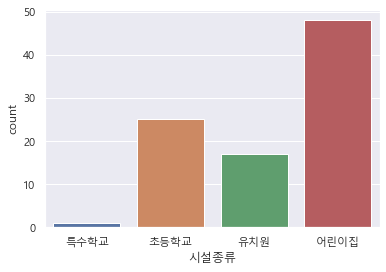

In [10]:
sns.countplot(x='시설종류',data=어린이보호구역)

__현재 어린이 보호구역 현황 시각화(종류별)__

In [11]:
center =[37.15222, 127.07056]
zoom =13

types = 어린이보호구역['시설종류'].unique().tolist()

colors=['orange','blue','green','red']

m = folium.Map(location=center, zoom_start=zoom)

folium.GeoJson(
    법정경계_읍면동,
    style_function=lambda feature: {
        'color': '#8b00ff',
        'weight': 3,
        'dashArray': '1,2,1'
    }
).add_to(m)

for place in 어린이보호구역.iloc:
    type_ , name , has_cctv , num_cctv , road_width , longitude , latitude = place.values.tolist()
    idx = types.index(type_)

    folium.Marker(
      location=[latitude,longitude],
      popup=name,
      icon=folium.Icon(color=colors[idx],icon='child',prefix="fa")
    ).add_to(m)

m

In [12]:
학원_및_교습소_현황['업종구분명'].value_counts()

학교교과교습학원    1590
평생직업교육학원     106
교습소           90
Name: 업종구분명, dtype: int64

In [13]:
학원_및_교습소_현황.head(10)

,업종구분명,교습과정명,시설위치_경도,시설위치_위도
0,교습소,음악,127.048919,37.146279
1,교습소,미술,127.048919,37.146279
2,교습소,보습,127.052419,37.145809
3,학교교과교습학원,"종합(국,수,사,과,논술)",127.048919,37.146279
4,학교교과교습학원,피아노(체르니40이상),127.048919,37.146279
5,학교교과교습학원,"관현악(바이올린,플룻)",127.048919,37.146279
6,학교교과교습학원,피아노(바이엘),127.048919,37.146279
7,학교교과교습학원,수학(고등),127.046027,37.147560
8,학교교과교습학원,영어,127.048919,37.146279
9,학교교과교습학원,피아노(체르니100),127.048919,37.146279


In [14]:
학원_및_교습소_현황['시설위치_경도'].value_counts()

127.073777    63
127.068752    55
127.074729    49
127.044759    43
127.070391    42
              ..
127.085471     1
127.052419     1
127.071194     1
127.062674     1
127.052619     1
Name: 시설위치_경도, Length: 197, dtype: int64

In [15]:
def get_hak_nearby(row,range_):
    global 학원_및_교습소_현황
    
    pos = (row['보호구역_위도'],row['보호구역_경도'])
    coord_set=set()
    cnt=0
    
    for line in 학원_및_교습소_현황.iloc:
        tar = (line['시설위치_위도'],line['시설위치_경도'])        
        if (haversine(pos,tar)*1000 <= range_) and (tar not in coord_set) :
            coord_set.add(tar)
            cnt+=1
            
    return cnt

어린이보호구역['근방(50m) 학원/교습소 수'] = 어린이보호구역.apply(lambda x : get_hak_nearby(x,50),axis=1)
어린이보호구역['근방(100m) 학원/교습소 수'] = 어린이보호구역.apply(lambda x : get_hak_nearby(x,100),axis=1)

어린이보호구역.head(5)

,시설종류,시설명,CCTV설치여부,CCTV설치대수,보호구역도로폭,보호구역_경도,보호구역_위도,근방(50m) 학원/교습소 수,근방(100m) 학원/교습소 수
0,특수학교,성심학교,N,0,25,127.017521,37.176762,0,0
1,초등학교,가수초등학교,Y,1,12,127.047957,37.148103,0,0
2,초등학교,광성초등학교,Y,2,12,127.039709,37.184197,0,0
3,초등학교,대호초등학교,Y,3,12,127.057889,37.159106,0,2
4,초등학교,매홀초등학교,Y,2,6,127.063282,37.162749,0,0


In [16]:
어린이보호구역["근방(50m) 학원/교습소 수"].value_counts()

0    78
1     9
3     3
2     1
Name: 근방(50m) 학원/교습소 수, dtype: int64

In [17]:
어린이보호구역[어린이보호구역["근방(50m) 학원/교습소 수"]>0]

,시설종류,시설명,CCTV설치여부,CCTV설치대수,보호구역도로폭,보호구역_경도,보호구역_위도,근방(50m) 학원/교습소 수,근방(100m) 학원/교습소 수
18,초등학교,화성초등학교,Y,3,12,127.069192,37.164773,1,2
33,유치원,이림유치원,Y,1,4,127.085741,37.135543,1,1
35,유치원,동탄우리유치원,Y,1,4,127.060252,37.196997,1,2
40,유치원,숲속다원유치원,Y,1,6,127.037738,37.151699,1,1
48,어린이집,시립매홀어린이집,Y,1,13,127.058825,37.172027,2,4
57,어린이집,하얀뜰어린이집,Y,1,3,127.071543,37.131670,1,3
62,어린이집,좋은아이어린이집,Y,1,5,127.060901,37.164621,1,1
65,어린이집,둥근해어린이집,N,0,7,127.056508,37.161239,3,4
68,어린이집,그린어린이집,N,0,4,127.069611,37.149776,1,1
69,어린이집,대일어린이집,Y,2,5,127.069474,37.154011,3,4


In [18]:
어린이보호구역["근방(100m) 학원/교습소 수"].value_counts()

0    59
1    16
2     8
3     4
4     3
5     1
Name: 근방(100m) 학원/교습소 수, dtype: int64

In [19]:
어린이보호구역[어린이보호구역["근방(100m) 학원/교습소 수"]>0].describe(include='all')

,시설종류,시설명,CCTV설치여부,CCTV설치대수,보호구역도로폭,보호구역_경도,보호구역_위도,근방(50m) 학원/교습소 수,근방(100m) 학원/교습소 수
count,32,32,32,32.000000,32.00000,32.000000,32.000000,32.000000,32.000000
unique,3,32,2,NaN,NaN,NaN,NaN,NaN,NaN
top,어린이집,해오름어린이집,Y,NaN,NaN,NaN,NaN,NaN,NaN
freq,18,1,25,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,1.125000,7.40625,127.065591,37.150347,0.625000,1.906250
std,NaN,NaN,NaN,0.832796,3.44411,0.010305,0.016058,0.941858,1.146084
min,NaN,NaN,NaN,0.000000,3.00000,127.037738,37.130553,0.000000,1.000000
25%,NaN,NaN,NaN,1.000000,5.75000,127.058774,37.135125,0.000000,1.000000
50%,NaN,NaN,NaN,1.000000,6.00000,127.069333,37.150737,0.000000,1.500000
75%,NaN,NaN,NaN,1.000000,8.25000,127.071710,37.161869,1.000000,2.250000


__어린이 보호구역 별로 반경 50m 에 학원/교습소가 얼마나 있는지__

In [20]:
center =[37.15222, 127.07056]
zoom =13

types = 어린이보호구역['시설종류'].unique().tolist()

colors=['orange','blue','green','red']

m2 = folium.Map(location=center, zoom_start=zoom)

folium.GeoJson(
    법정경계_읍면동,
    style_function=lambda feature: {
        'color': '#8b00ff',
        'weight': 3,
        'opacity':0.2,
        'dashArray': '1,2,1'
    }
).add_to(m2)

for place in 어린이보호구역.iloc:
    type_ , name , has_cctv , num_cctv , road_width , longitude , latitude, hak_50 , hak_100 = place.values.tolist()
    idx = types.index(type_)

    folium.Circle(
        location=[latitude,longitude],
        radius=50*int(hak_50)+10,
        color=colors[idx]
    ).add_to(m2)

m2

__어린이 보호구역 별로 반경 100m 에 학원/교습소가 얼마나 있는지__

In [21]:
center =[37.15222, 127.07056]
zoom =13

types = 어린이보호구역['시설종류'].unique().tolist()

colors=['orange','blue','green','red']

m3 = folium.Map(location=center, zoom_start=zoom)

folium.GeoJson(
    법정경계_읍면동,
    style_function=lambda feature: {
        'color': '#8b00ff',
        'weight': 3,
        'opacity':0.2,
        'dashArray': '1,2,1'
    }
).add_to(m3)

for place in 어린이보호구역.iloc:
    type_ , name , has_cctv , num_cctv , road_width , longitude , latitude, hak_50 , hak_100 = place.values.tolist()
    idx = types.index(type_)

    folium.Circle(
        location=[latitude,longitude],
        radius=50*int(hak_100)+10,
        color=colors[idx]
    ).add_to(m3)

m3

__총인구수 격자데이터 Choropleth 로 나타내기__

In [22]:
with open(os.path.join(path,'4.오산시_연령별_거주인구격자(총인구).geojson'),encoding="utf-8") as f:
        info = json.loads(f.read())

main_info = [dic['properties'] for dic in info['features']]
df = pd.DataFrame(main_info)
df.val = df.val.fillna(0)

In [23]:
geo_data= os.path.join(path,'4.오산시_연령별_거주인구격자(총인구).geojson')

center =[37.15222, 127.07056]
zoom =13
    
m4 = folium.Map(location=center, zoom_start=zoom)

folium.Choropleth(
    geo_data=geo_data,
    data=df,
    columns=('gid','val'),
    key_on='feature.properties.gid',
    fill_color='Paired',
    line_opacity=0.2,
    legend_name='인구수 격자데이터',
).add_to(m4)

folium.GeoJson(
    법정경계_읍면동,
    style_function=lambda feature: {
        'color': '#8b00ff',
        'weight': 3,
        'opacity':0.2,
        'dashArray': '1,2,1'
    }
).add_to(m4)

for place in 어린이보호구역.iloc:
    type_ , name , has_cctv , num_cctv , road_width , longitude , latitude, hak_50 , hak_100 = place.values.tolist()
    idx = types.index(type_)

    folium.Circle(
        location=[latitude,longitude],
        radius=50*int(hak_100)+10,
        color=colors[idx]
    ).add_to(m4)

m4

In [24]:
# m4.save("map5.html")

In [25]:
거주인구격자_유소년.head(4)

,gid,val,geometry
0,다사551085,NaN,"MULTIPOLYGON (((126.99422 37.17418, 126.99421 ..."
1,다사551086,NaN,"MULTIPOLYGON (((126.99421 37.17508, 126.99420 ..."
2,다사551087,NaN,"MULTIPOLYGON (((126.99420 37.17599, 126.99420 ..."
3,다사551088,NaN,"MULTIPOLYGON (((126.99420 37.17689, 126.99419 ..."


In [26]:
geo_data= os.path.join(path,'5.오산시_연령별_거주인구격자(유소년).geojson')

with open(geo_data,encoding="utf-8") as f:
    info = json.loads(f.read())

main_info = [dic['properties'] for dic in info['features']]
df = pd.DataFrame(main_info)
df.val = df.val.fillna(0)
df_nz = df[df.val>0]

center =[37.15222, 127.07056]
zoom =13
    
m4 = folium.Map(location=center, zoom_start=zoom)

folium.Choropleth(
    geo_data=geo_data,
    data=df_nz,
    columns=('gid','val'),
    key_on='feature.properties.gid',
    fill_color='Paired',
    line_opacity=0.2,
    legend_name='인구수 격자데이터',
).add_to(m4)

folium.GeoJson(
    법정경계_읍면동,
    style_function=lambda feature: {
        'color': '#ffffff',
        'weight': 3,
        'opacity':0.4,
        'dashArray': '1,2,1'
    }
).add_to(m4)

for place in 어린이보호구역.iloc:
    type_ , name , has_cctv , num_cctv , road_width , longitude , latitude, hak_50 , hak_100 = place.values.tolist()
    idx = types.index(type_)
    
    if hak_100:
        folium.Circle(
            location=[latitude,longitude],
            radius=50*int(hak_100)+10,
            color=colors[idx],
            tooltip=name
        ).add_to(m4)

m4

## 학원 근처 => 어린이 교통사고 관련?

In [42]:
어린이교통사고_격자['cut']=0
어린이교통사고_격자['cut'][어린이교통사고_격자.accident_cnt>=3]=1
어린이교통사고_격자['cut'][어린이교통사고_격자.accident_cnt>=5]=2
어린이교통사고_격자['cut'][어린이교통사고_격자.accident_cnt>=7]=3
어린이교통사고_격자['cut'][어린이교통사고_격자.accident_cnt>=10]=4

In [64]:
center =[37.15222, 127.07056]
zoom =13
    
m5 = folium.Map(location=center, zoom_start=zoom)

geo_data = os.path.join(path,'2.오산시_어린이교통사고_격자.geojson')

folium.Choropleth(
    geo_data=geo_data,
    data=어린이교통사고_격자[어린이교통사고_격자.cut>0],
    columns=('gid','accident_cnt'),
    key_on='feature.properties.gid',
    fill_color='BrBG',
    line_opacity=0.2,
    legend_name='어린이 교통사고 발생 수',
).add_to(m5)

folium.GeoJson(
    법정경계_읍면동,
    style_function=lambda feature: {
        'color': '#ffffff',
        'weight': 2.5,
        'opacity':0.5,
        'dashArray': '1,2,1'
    }
).add_to(m5)

for place in 어린이보호구역.iloc:
    type_ , name , has_cctv , num_cctv , road_width , longitude , latitude, hak_50 , hak_100 = place.values.tolist()
    idx = types.index(type_)
    
    if hak_100:
        folium.Circle(
            location=[latitude,longitude],
            radius=50*int(hak_100)+10,
            color=colors[idx],
            tooltip=name
        ).add_to(m5)

m5